In [5]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append('../')

from datasets import NetflixGenreCastData, MovieLensGenreCastUserData
from utils import sample, show_matrix, to_dense, bool_to_index, to_sparse, sort_order, multiply, bool_to_index
from generators import BlockDiagonalMatrixGenerator, BlockMatrixGenerator
import numpy as np
from tqdm import tqdm
from multiprocessing import Pool
from p_tqdm import p_map

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# dataset: netflix

In [2]:
data = NetflixGenreCastData(size='small', source='imdb')
data.load()
display(data.Xs)
X, Y, Z = data.Xs

In [5]:
data.sample(factor_id=3, n_samples=1000, seed=None)

[I] Sampling axis 0 to size 1000
[I]   sampling seed    : 1704832006
[I]   sampling from    : (227737, 4945)
[I]              to    : (1000, 4945)


In [6]:
display(data.Xs)

[<9992x4945 sparse matrix of type '<class 'numpy.intc'>'
 	with 607803 stored elements in Compressed Sparse Row format>,
 <28x4945 sparse matrix of type '<class 'numpy.float64'>'
 	with 9166 stored elements in Compressed Sparse Row format>,
 <1000x4945 sparse matrix of type '<class 'numpy.float64'>'
 	with 498 stored elements in Compressed Sparse Row format>]

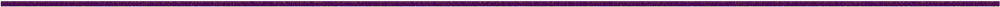

In [11]:
X, Y, Z = data.Xs

show_matrix(settings=[#(X.toarray(), [0, 0], 'X'), 
                      (Y.toarray(), [1, 0], 'Y')], 
            scaling=10)

# dataset: ml-100k

[<943x1682 sparse matrix of type '<class 'numpy.int32'>'
 	with 100000 stored elements in Compressed Sparse Row format>,
 <943x81 sparse matrix of type '<class 'numpy.float64'>'
 	with 3499 stored elements in Compressed Sparse Row format>,
 <26x1682 sparse matrix of type '<class 'numpy.float64'>'
 	with 4031 stored elements in Compressed Sparse Row format>,
 <4708x1682 sparse matrix of type '<class 'numpy.float64'>'
 	with 8306 stored elements in Compressed Sparse Row format>]

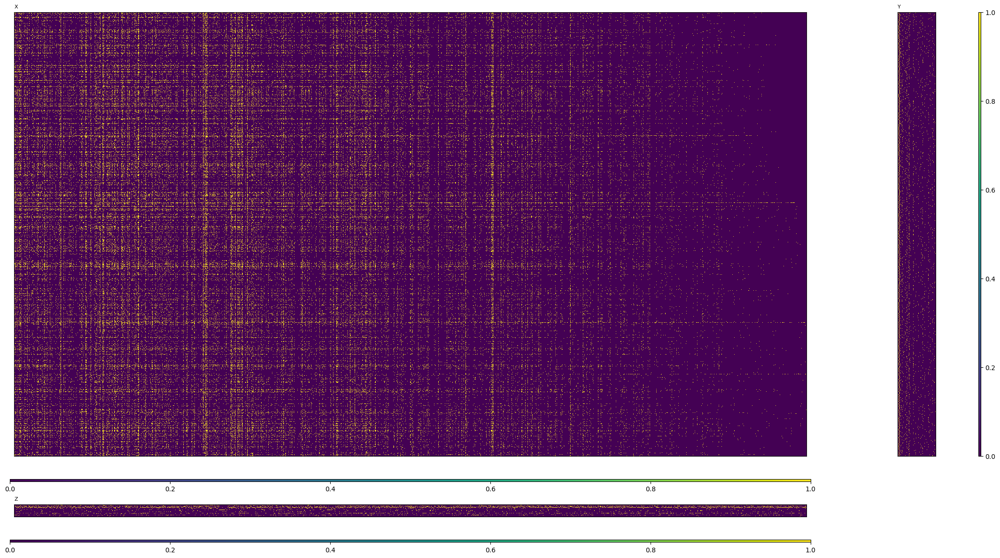

In [6]:
data = MovieLensGenreCastUserData(size='100k')
data.load()
display(data.Xs)

X, Y, Z, _ = data.Xs

show_matrix([(X.toarray(), [0, 0], 'X'), 
             (Y.toarray(), [0, 1], 'Y'), 
             (Z.toarray(), [1, 0], 'Z'), 
             ], colorbar=True)

# dataset: ml-1m

In [9]:
data = MovieLensGenreCastUserData(size='1m')
data.load()
display(data.Xs)

X, Y, Z, _ = data.Xs

show_matrix([(X.toarray(), [0, 0], 'X'), 
             (Y.toarray(), [0, 1], 'Y'), 
             (Z.toarray(), [1, 0], 'Z'), 
             ])

[<6040x3706 sparse matrix of type '<class 'numpy.int32'>'
 	with 1000209 stored elements in Compressed Sparse Row format>,
 <6040x82 sparse matrix of type '<class 'numpy.float64'>'
 	with 22451 stored elements in Compressed Sparse Row format>,
 <41x3706 sparse matrix of type '<class 'numpy.float64'>'
 	with 8946 stored elements in Compressed Sparse Row format>,
 <9488x3706 sparse matrix of type '<class 'numpy.float64'>'
 	with 18382 stored elements in Compressed Sparse Row format>]

# assoc and basis

In [5]:
# for X-Y-Z only

def build_assoc(X_train, normalize=True):
    '''Build the real-valued association matrix

    Confidence is the coverage made by vec_j within vec_i.

    # col_sum = self.X_train.sum(axis=0)
    # idx = col_sum != 0
    # self.assoc[idx] = self.assoc[idx] / col_sum[np.newaxis, idx]
    '''
    assoc = to_sparse(X_train.T @ X_train, 'lil').astype(float)
    n = X_train.shape[1]
    if normalize:
        for i in tqdm(range(n)):
            col_sum = X_train[:, i].sum()
            assoc[i, :] = (assoc[i, :] / col_sum) if col_sum > 0 else 0
    return assoc

100%|██████████| 1682/1682 [00:04<00:00, 391.54it/s]


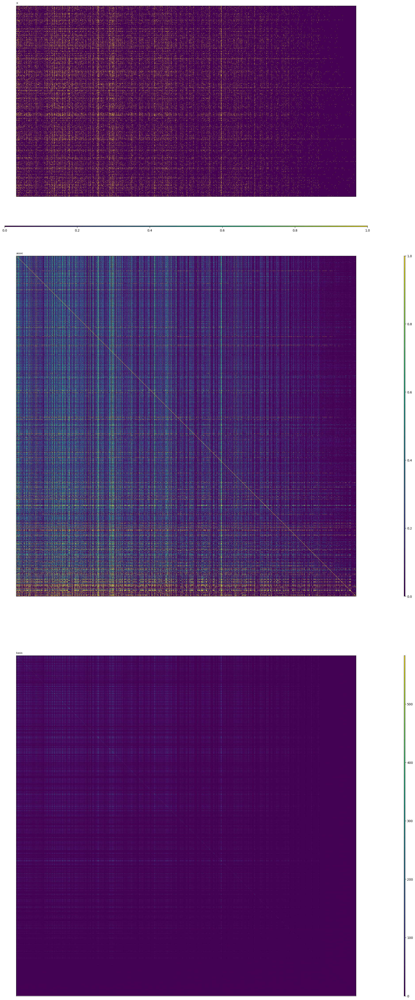

100%|██████████| 1682/1682 [00:01<00:00, 1327.88it/s]


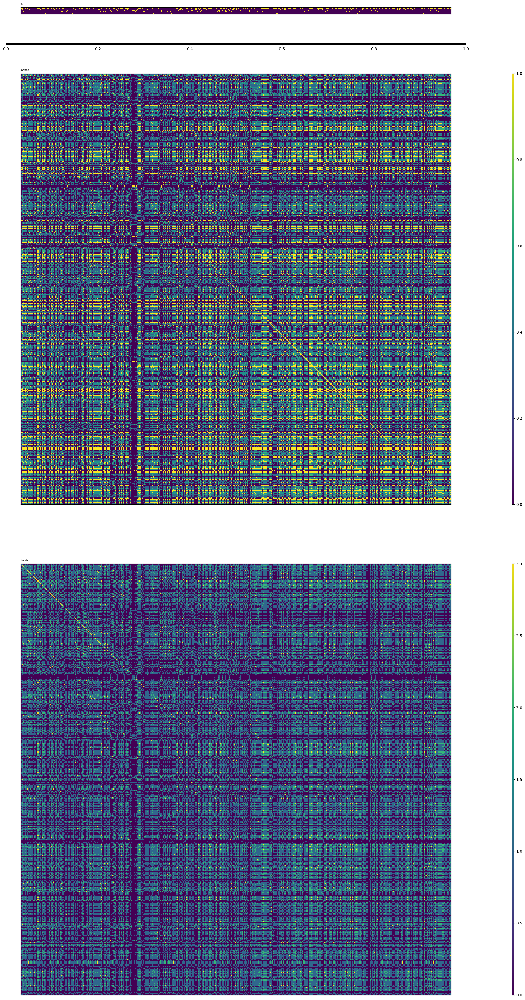

In [10]:
A = X

assoc = build_assoc(A)
basis = build_assoc(A, normalize=False)

show_matrix([(A.toarray(), [0, 0], 'X'), 
             (assoc.toarray(), [1, 0], 'assoc'), 
             (basis.toarray(), [2, 0], 'basis'), 
             ], colorbar=True, scaling=0.5)

A = Z

assoc = build_assoc(A)
basis = build_assoc(A, normalize=False)

show_matrix([(A.toarray(), [0, 0], 'X'), 
             (assoc.toarray(), [1, 0], 'assoc'), 
             (basis.toarray(), [2, 0], 'basis'), 
             ], colorbar=True, scaling=0.5)

100%|██████████| 943/943 [00:01<00:00, 586.67it/s]


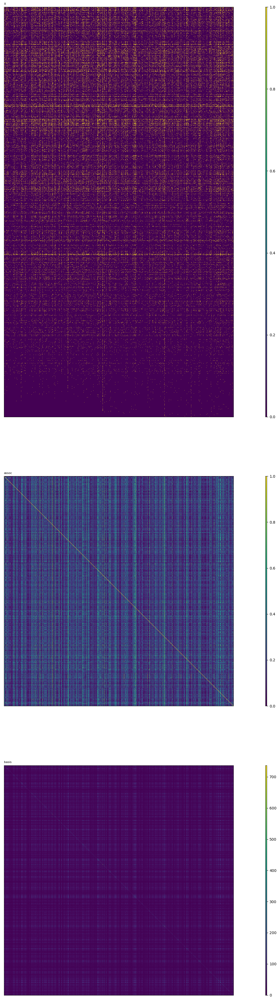

In [9]:
A = X.T

assoc = build_assoc(A)
basis = build_assoc(A, normalize=False)

show_matrix([(A.toarray(), [0, 0], 'X'), 
             (assoc.toarray(), [1, 0], 'assoc'), 
             (basis.toarray(), [2, 0], 'basis'), 
             ], colorbar=True, scaling=0.5)

A = Y.T

assoc = build_assoc(A)
basis = build_assoc(A, normalize=False)

show_matrix([(A.toarray(), [0, 0], 'X'), 
             (assoc.toarray(), [1, 0], 'assoc'), 
             (basis.toarray(), [2, 0], 'basis'), 
             ], colorbar=True, scaling=0.5)

In [63]:
from scipy.stats import rankdata

def build_basis(assoc):
    '''Get the binary-valued basis candidates

    Note: rankdata doesn't have sparsity support.

    The highest value will be assigned with 1.
    '''
    basis = rankdata(assoc.toarray(), method='dense', axis=1)
    basis = to_sparse(basis)
    return basis

100%|██████████| 943/943 [00:01<00:00, 596.28it/s]


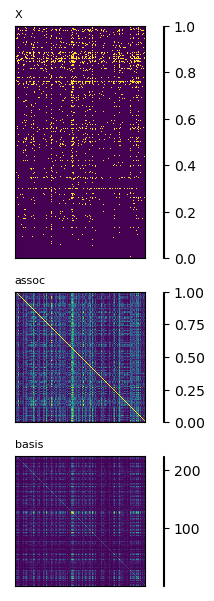

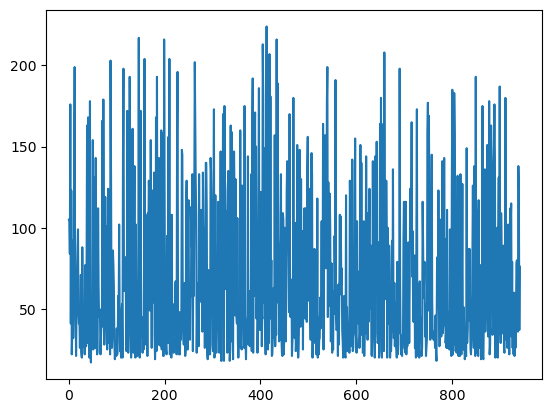

In [146]:
A = X.T

X_assoc = build_assoc(A)
X_basis = build_basis(X_assoc)

show_matrix([(A.toarray(), [0, 0], 'X'), 
             (X_assoc.toarray(), [1, 0], 'assoc'), 
             (X_basis.toarray(), [2, 0], 'basis'), 
             ], colorbar=True, scaling=0.5)

import matplotlib.pyplot as plt

plt.plot(X_basis.toarray().max(axis=1))
plt.show()

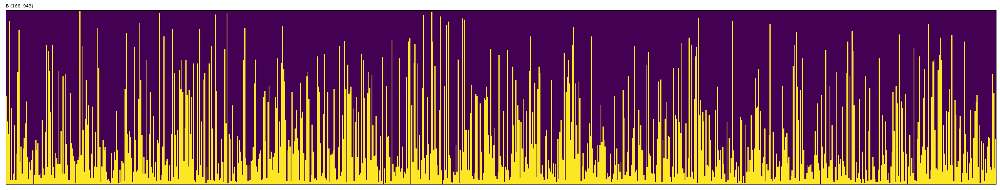

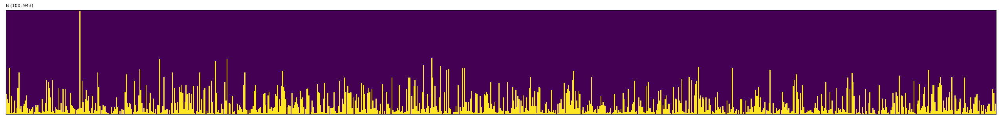

In [147]:
row = 70
A = X_basis[row]

B = np.zeros((A.max(), A.shape[1]))
for i in range(B.shape[0]):
    B[i, :] = (A > A.max() - i).toarray() * 1
    
show_matrix([(B, [0, 0], 'B {}'.format(B.shape)), 
            ], colorbar=False, pixels=5)

steps = 100
A = X_assoc[row]

B = np.zeros((steps, A.shape[1]))
for i in range(steps):
    B[i, :] = (A > 1 - i / steps).toarray() * 1
    
show_matrix([(B, [0, 0], 'B {}'.format(B.shape)), 
            ], colorbar=False, pixels=5)

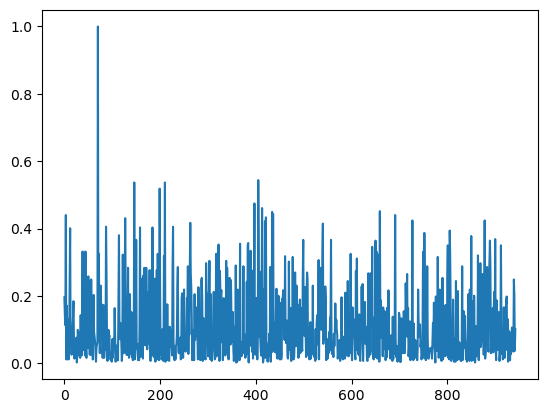

In [72]:
plt.plot(X_assoc[row].toarray().squeeze())
plt.show()

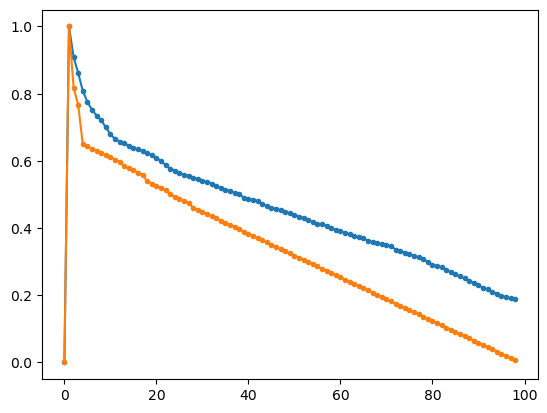

In [148]:
row = 19
A = X_basis[row]

mask_mean = np.zeros(A.max())
mask_min = np.zeros(A.max())

for i in range(A.max()):
    mask = (A > A.max() - i).toarray()
    if not mask.any():
        masked = [0]
    else:
        masked = X_assoc[row, mask.squeeze()].toarray()

    mask_mean[i] = np.mean(masked)
    mask_min[i] = np.min(masked)

plt.plot(mask_mean, marker='.')
plt.plot(mask_min, marker='.')

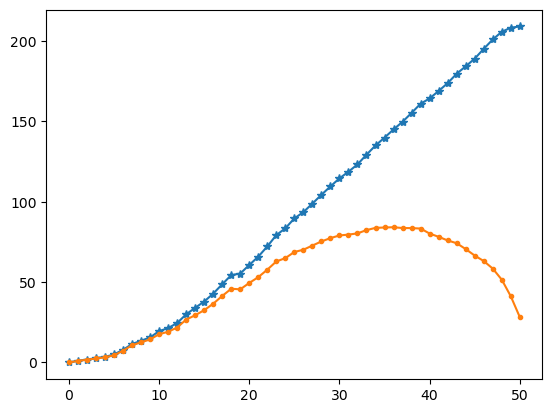

In [233]:
row = 10
A = X_basis[row]

mask_mean = np.zeros(A.max())
mask_min = np.zeros(A.max())

for i in range(A.max()):
    mask = (A > A.max() - i).toarray()
    if not mask.any():
        masked = [0]
    else:
        masked = X_assoc[row, mask.squeeze()].toarray()

    mask_mean[i] = np.mean(masked) * mask.sum()
    mask_min[i] = np.min(masked) * mask.sum()

plt.plot(mask_mean, marker='*')
plt.plot(mask_min, marker='.')

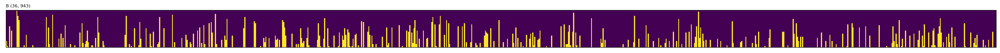

In [150]:
B = np.zeros((mask_min.argmax(), A.shape[1]))
for i in range(mask_min.argmax()):
    B[i, :] = (A > A.max() - i).toarray() * 1
    
show_matrix([(B, [0, 0], 'B {}'.format(B.shape)), 
            ], colorbar=False, pixels=5)

100%|██████████| 943/943 [00:00<00:00, 1671.34it/s]


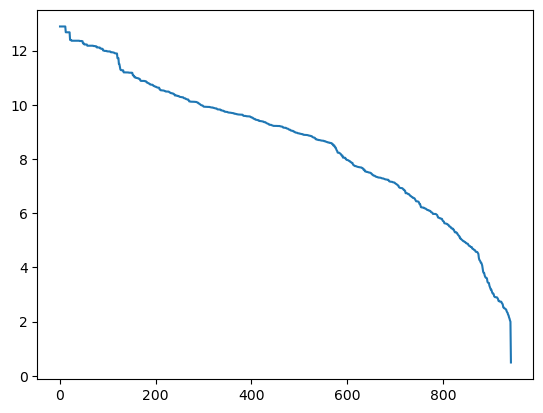

In [228]:
A = Y.T

Y_assoc = build_assoc(A)
Y_basis = build_basis(Y_assoc)

masked_mean_Y = np.zeros(Y_assoc.shape[0])


for i in range(B.shape[0]):
    mask = B[i].astype(bool).squeeze()
    if mask.any():
        masked = Y_assoc[:, mask].toarray()
        masked_mean = masked.mean(axis=1)
    else:
        masked_mean = np.zeros(Y_assoc.shape[0])
    masked_mean_Y = np.add(masked_mean_Y, masked_mean)

idx = np.argsort(masked_mean_Y)
idx = np.flip(idx)
top_50_masked = masked.mean(axis=1)[idx][:50]
    
row_X = row
row_Y = idx[0]

# C = B = np.zeros((A.max(), A.shape[1]))
# for i in range(B.shape[0]):
#     B[i, :] = (A > A.max() - i).toarray() * 1

#     # find best overlap


#     print(j)

plt.plot(masked_mean_Y[idx])

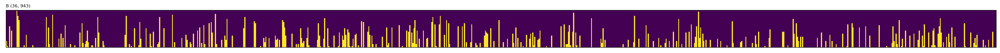

In [230]:
show_matrix([(B, [0, 0], 'B {}'.format(B.shape)), 
            ], colorbar=False, pixels=5)

100%|██████████| 943/943 [00:00<00:00, 1647.89it/s]


X_level 72 Y_levels [1 2 3 4]


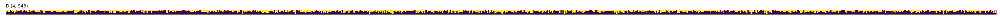

X_level 71 Y_levels [1 2 3 4]


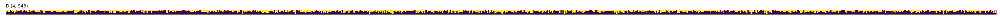

X_level 70 Y_levels [1 2 3 4]


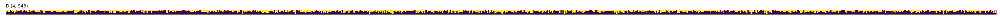

X_level 69 Y_levels [1 2 3 4]


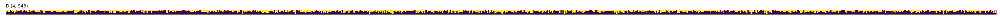

X_level 68 Y_levels [1 2 3 4]


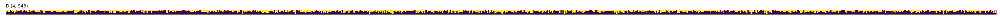

X_level 67 Y_levels [1 2 3 4]


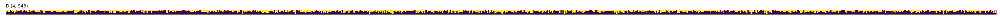

X_level 66 Y_levels [1 2 3 4]


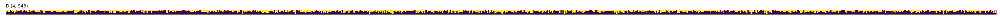

X_level 65 Y_levels [1 2 3 4]


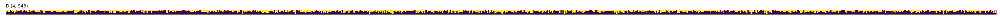

X_level 64 Y_levels [1 2 3 4]


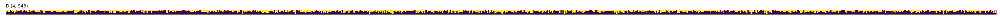

X_level 63 Y_levels [1 2 3 4]


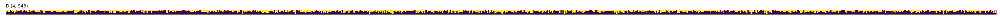

X_level 62 Y_levels [1 2 3 4]


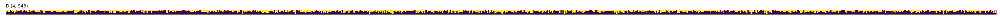

X_level 61 Y_levels [1 2 3 4]


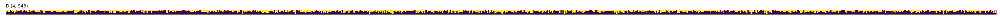

X_level 60 Y_levels [1 2 3 4]


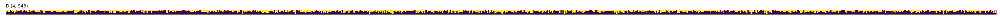

X_level 59 Y_levels [1 2 3 4]


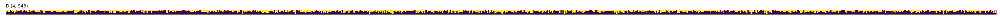

X_level 58 Y_levels [1 2 3 4]


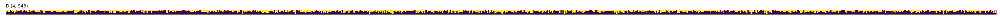

X_level 57 Y_levels [1 2 3 4]


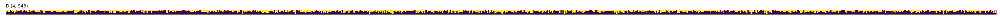

X_level 56 Y_levels [1 2 3 4]


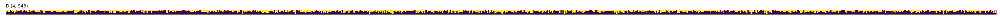

X_level 55 Y_levels [1 2 3 4]


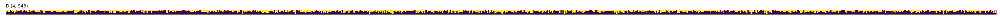

X_level 54 Y_levels [1 2 3 4]


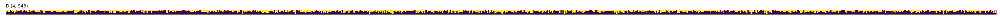

X_level 53 Y_levels [1 2 3 4]


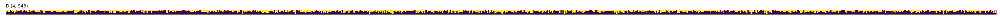

X_level 52 Y_levels [1 2 3 4]


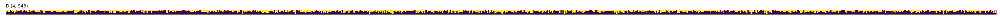

X_level 51 Y_levels [1 2 3 4]


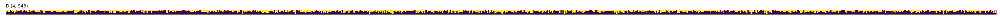

X_level 50 Y_levels [1 2 3 4]


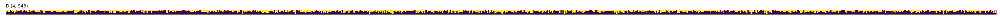

X_level 49 Y_levels [1 2 3 4]


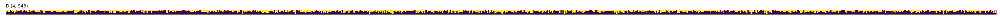

X_level 48 Y_levels [1 2 3 4]


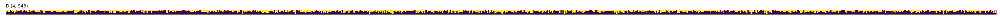

X_level 47 Y_levels [1 2 3 4]


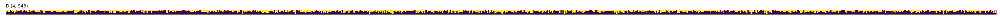

X_level 46 Y_levels [1 2 3 4]


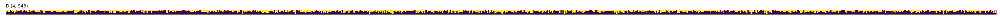

X_level 45 Y_levels [1 2 3 4]


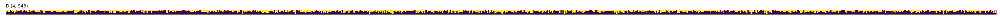

X_level 44 Y_levels [1 2 3 4]


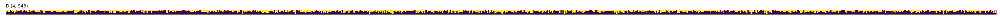

X_level 43 Y_levels [1 2 3 4]


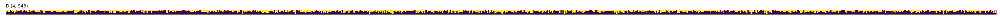

X_level 42 Y_levels [1 2 3 4]


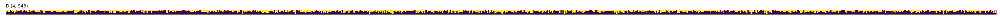

X_level 41 Y_levels [1 2 3 4]


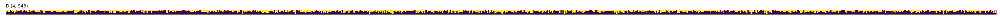

X_level 40 Y_levels [1 2 3 4]


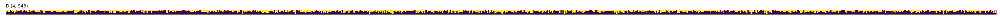

X_level 39 Y_levels [1 2 3 4]


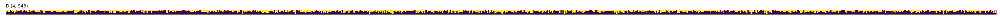

X_level 38 Y_levels [1 2 3 4]


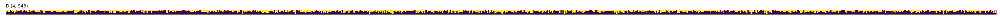

X_level 37 Y_levels [1 2 3 4]


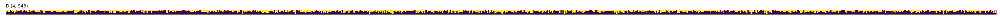

X_level 36 Y_levels [1 2 3 4]


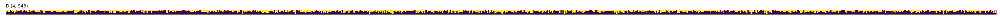

X_level 35 Y_levels [1 2 3 4]


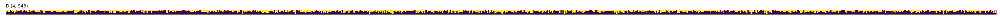

X_level 34 Y_levels [1 2 3 4]


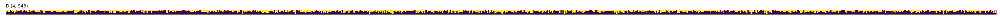

X_level 33 Y_levels [1 2 3 4]


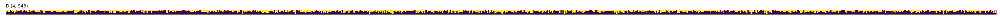

X_level 32 Y_levels [1 2 3 4]


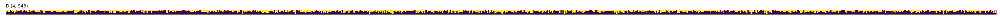

X_level 31 Y_levels [1 2 3 4]


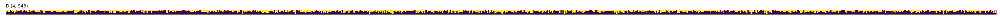

X_level 30 Y_levels [1 2 3]


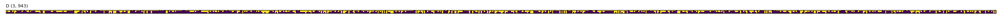

X_level 29 Y_levels [1 2 3]


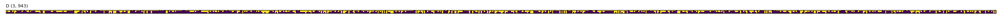

X_level 28 Y_levels [1 2 3]


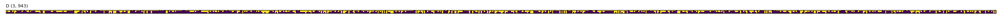

X_level 27 Y_levels [1 2 3]


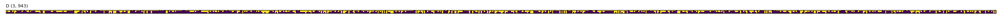

X_level 26 Y_levels [1 2 3]


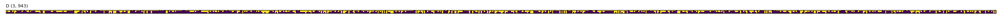

X_level 25 Y_levels [1 2 3]


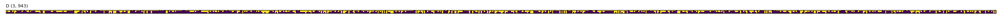

X_level 24 Y_levels [1 2 3]


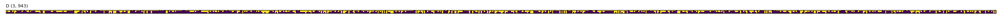

X_level 23 Y_levels [1 2 3]


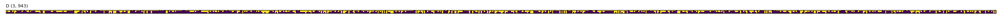

X_level 22 Y_levels [1 2 3]


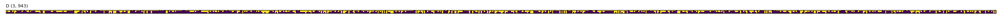

X_level 21 Y_levels [1 2 3]


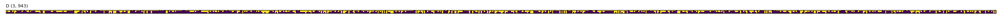

X_level 20 Y_levels [1 2 3]


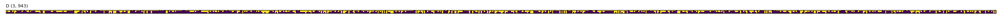

X_level 19 Y_levels [1 2 3]


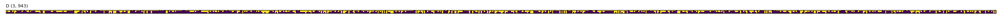

X_level 18 Y_levels [1 2 3]


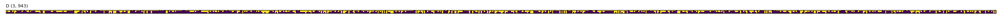

X_level 17 Y_levels [1 2 3]


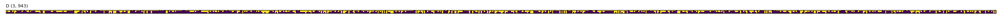

X_level 16 Y_levels [1 2 3]


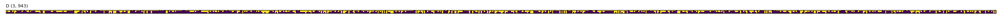

X_level 15 Y_levels [1 2 3]


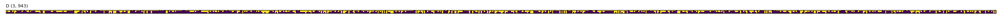

X_level 14 Y_levels [1 2 3]


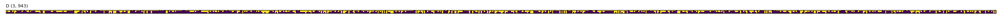

X_level 13 Y_levels [1 2 3]


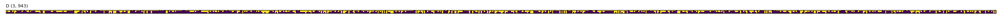

X_level 12 Y_levels [1 2 3]


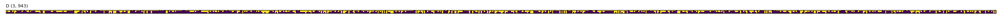

X_level 11 Y_levels [1 2 3]


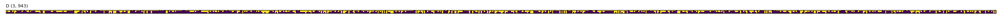

X_level 10 Y_levels [1 2 3]


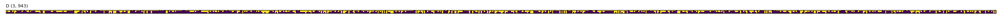

X_level 9 Y_levels [1 2 3]


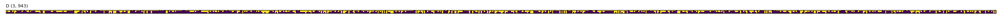

X_level 8 Y_levels [1 2 3]


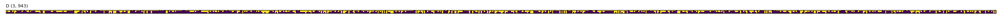

X_level 7 Y_levels [1 2 3]


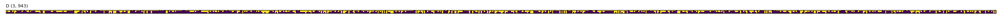

X_level 6 Y_levels [1 2 3]


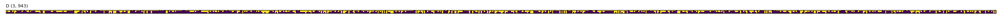

X_level 5 Y_levels [1 2 3]


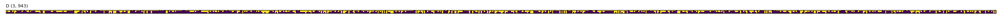

X_level 4 Y_levels [2 3]


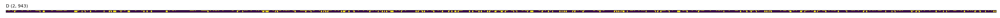

X_level 3 Y_levels [2]


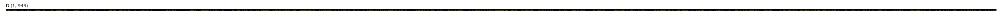

no D-mask found on i=70, X_level=2
empty B-mask on i=71, X_level=1


In [249]:
def find_best_overlap(X_assoc, X_basis, Y_assoc, Y_basis, row_X, row_Y=None):

    # a row in X
    A = X_basis[row_X]

    # all possible spans
    B = np.zeros((A.max(), A.shape[1]))
    for i in range(B.shape[0]):
        B[i, :] = (A > A.max() - i).toarray() * 1

    # rank all possible spans by min_assoc * mask_sum
    mask_min = np.zeros(A.max())

    for i in range(A.max()):
        mask = (A > A.max() - i).toarray()
        if not mask.any():
            masked = [0]
        else:
            masked = X_assoc[row_X, mask.squeeze()].toarray()
        mask_min[i] = np.min(masked) * mask.sum()
    
    # part of spans that includes the optimal
    B = np.zeros((mask_min.argmax(), A.shape[1]))
    for i in range(mask_min.argmax()):
        B[i, :] = (A > A.max() - i).toarray() * 1

    # finding good rows in Y
    masked_mean_sum = np.zeros(Y_assoc.shape[0]) # sum of scores (assoc_mean * mask_sum)

    for i in range(B.shape[0]):
        mask = B[i].astype(bool).squeeze()
        if mask.any():
            masked = Y_assoc[:, mask].toarray()
            masked_mean = masked.mean(axis=1)
        else:
            masked_mean = np.zeros(Y_assoc.shape[0])
        masked_mean_sum = np.add(masked_mean_sum, masked_mean)

    idx = np.argsort(masked_mean_sum)
    idx = np.flip(idx)
    # top_50_masked = masked.mean(axis=1)[idx][:50]
    
    # get best row pair in X and Y
    row_X = row_X
    row_Y = idx[0]
    C = Y_basis[row_Y]

    X_levels = np.arange(start=mask_min.argmax(), step=-1, stop=0)

    for i, X_level in enumerate(X_levels):
        B_mask = B[X_level - 1].astype(bool) # starting from the largest mask

        if not B_mask.any():
            print(f"empty B-mask on i={i}, X_level={X_level}")
            continue

        C_masked = C[:, B_mask.squeeze()].toarray()

        # starting from the largest mask

        # C_masked_mean = C_masked.mean(axis=1)

        Y_levels = np.arange(start=C_masked.min(), step=1, stop=C_masked.max())

        if len(Y_levels) == 0:
            print(f"no D-mask found on i={i}, X_level={X_level}")
            continue

        # part of spans that includes the optimal
        D = np.zeros((len(Y_levels), C.shape[1]))
        for j, Y_level in enumerate(Y_levels):
            D[j, :] = (C > Y_level).toarray() * 1

        print('X_level', X_level, 'Y_levels', Y_levels)
        show_matrix([(D, [0, 0], 'D {}'.format(D.shape))
            ], colorbar=False, pixels=5)
        # 
        # return
        
        # for j in 


X_assoc = build_assoc(X.T)
X_basis = build_basis(X_assoc)

Y_assoc = build_assoc(Y.T)
Y_basis = build_basis(Y_assoc)

find_best_overlap(X_assoc, X_basis, Y_assoc, Y_basis, row_X=0, row_Y=None)

In [236]:
def find_best_overlap(X_assoc, X_basis, Y_assoc, Y_basis, row_X, row_Y=None):

    # a row in X
    A = X_basis[row_X]

    # all possible spans
    B = np.zeros((A.max(), A.shape[1]))
    for i in range(B.shape[0]):
        B[i, :] = (A > A.max() - i).toarray() * 1

    # rank all possible spans by min_assoc * mask_sum
    mask_min = np.zeros(A.max())

    for i in range(A.max()):
        mask = (A > A.max() - i).toarray()
        if not mask.any():
            masked = [0]
        else:
            masked = X_assoc[row_X, mask.squeeze()].toarray()
        mask_min[i] = np.min(masked) * mask.sum()
    
    # part of spans that includes the optimal
    B = np.zeros((mask_min.argmax(), A.shape[1]))
    for i in range(mask_min.argmax()):
        B[i, :] = (A > A.max() - i).toarray() * 1

    # finding good rows in Y
    masked_mean_sum = np.zeros(Y_assoc.shape[0]) # sum of scores (assoc_mean * mask_sum)

    for i in range(B.shape[0]):
        mask = B[i].astype(bool).squeeze()
        if mask.any():
            masked = Y_assoc[:, mask].toarray()
            masked_mean = masked.mean(axis=1)
        else:
            masked_mean = np.zeros(Y_assoc.shape[0])
        masked_mean_sum = np.add(masked_mean_sum, masked_mean)

    idx = np.argsort(masked_mean_sum)
    idx = np.flip(idx)
    # top_50_masked = masked.mean(axis=1)[idx][:50]
    
    # get best row pair in X and Y
    row_X = row_X
    row_Y = idx[0]
    C = Y_basis[row_Y]

    X_levels = np.arange(start=mask_min.argmax(), step=-1, stop=0)

    for i, X_level in enumerate(X_levels):
        B_mask = B[X_level - 1].astype(bool) # starting from the largest mask

        if not B_mask.any():
            print(f"empty B-mask on i={i}, X_level={X_level}")
            continue

        C_masked = C[:, B_mask.squeeze()].toarray()

        # starting from the largest mask
        Y_levels = np.arange(start=C_masked.min(), step=1, stop=C_masked.max())

        if len(Y_levels) == 0:
            print(f"no D-mask found on i={i}, X_level={X_level}")
            continue

        # part of spans that includes the optimal
        D = np.zeros((len(Y_levels), C.shape[1]))
        for j, Y_level in enumerate(Y_levels):
            D[j, :] = (C > Y_level).toarray() * 1

        print('X_level', X_level, 'Y_levels', Y_levels)
        show_matrix([(D, [0, 0], 'D {}'.format(D.shape))
            ], colorbar=False, pixels=5)
        
        
        
        # for j in 


X_assoc = build_assoc(X.T)
X_basis = build_basis(X_assoc)

Y_assoc = build_assoc(Y.T)
Y_basis = build_basis(Y_assoc)

find_best_overlap(X_assoc, X_basis, Y_assoc, Y_basis, row_X=0, row_Y=None)

array([10,  9,  8,  7,  6,  5,  4,  3,  2])

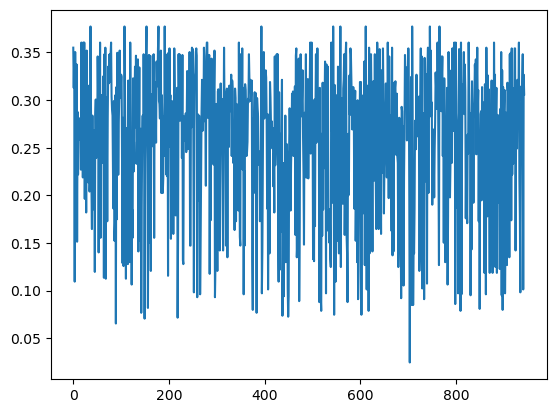

In [214]:
plt.plot(masked.mean(axis=1)[idx])

In [209]:
# masked_mean_Y = np.zeros(Y_assoc.shape[0])

i = 10
mask = B[i].astype(bool).squeeze()
masked = Y_assoc[:, mask].toarray()
masked_mean = masked.mean(axis=1) if len(masked) != 0 else np.zeros(Y_assoc.shape[0])
masked_mean_Y = np.add(masked_mean_Y, masked_mean)

In [210]:
masked_mean_Y

array([0.27777778, 0.11111111, 0.31481481, 0.26851852, 0.14814815,
       0.21296296, 0.2037037 , 0.22222222, 0.37037037, 0.19444444,
       0.14814815, 0.22222222, 0.21296296, 0.18518519, 0.08641975,
       0.2962963 , 0.25925926, 0.14814815, 0.25925926, 0.12345679,
       0.30555556, 0.2962963 , 0.09876543, 0.19753086, 0.24074074,
       0.19444444, 0.13580247, 0.25      , 0.26851852, 0.22222222,
       0.28703704, 0.28395062, 0.34259259, 0.11111111, 0.17283951,
       0.2962963 , 0.35185185, 0.20987654, 0.25      , 0.21296296,
       0.23148148, 0.23148148, 0.19753086, 0.26851852, 0.31481481,
       0.17283951, 0.17592593, 0.2037037 , 0.28395062, 0.30555556,
       0.2962963 , 0.28395062, 0.31481481, 0.27777778, 0.27777778,
       0.28703704, 0.27777778, 0.31481481, 0.19444444, 0.18518519,
       0.24074074, 0.19753086, 0.22222222, 0.23148148, 0.07407407,
       0.34259259, 0.35185185, 0.35185185, 0.2962963 , 0.2962963 ,
       0.21296296, 0.0617284 , 0.35185185, 0.22222222, 0.27777

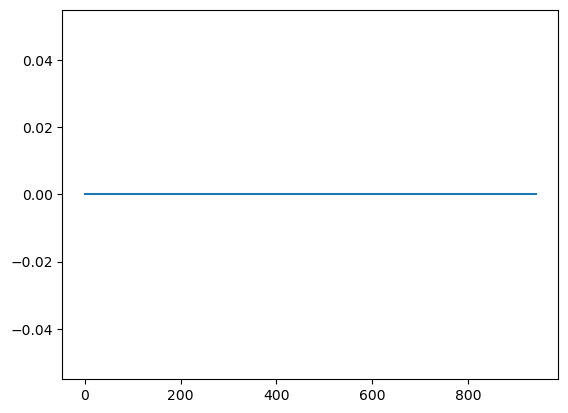

In [203]:
plt.plot(masked_mean_Y)

Text(0.5, 1.0, 'mean of rows in masked Y')

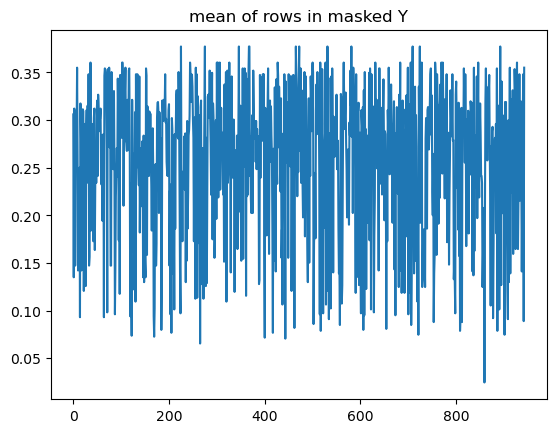

In [172]:
plt.plot(masked.mean(axis=1))
plt.title("mean of rows in masked Y")

Text(0.5, 1.0, 'sorted mean of rows in masked Y')

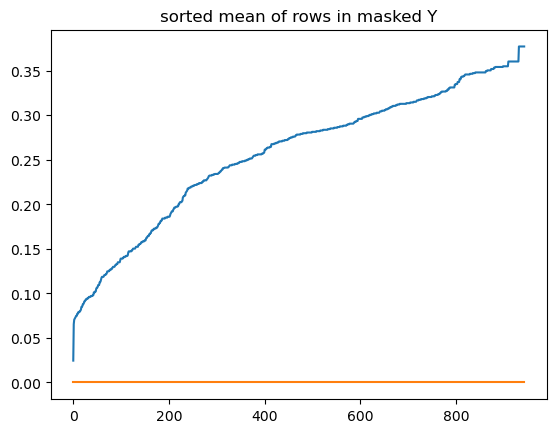

In [173]:
idx = np.argsort(masked.mean(axis=1))
plt.plot(masked.mean(axis=1)[idx])
plt.plot(masked.min(axis=1)[idx])
plt.title("sorted mean of rows in masked Y")

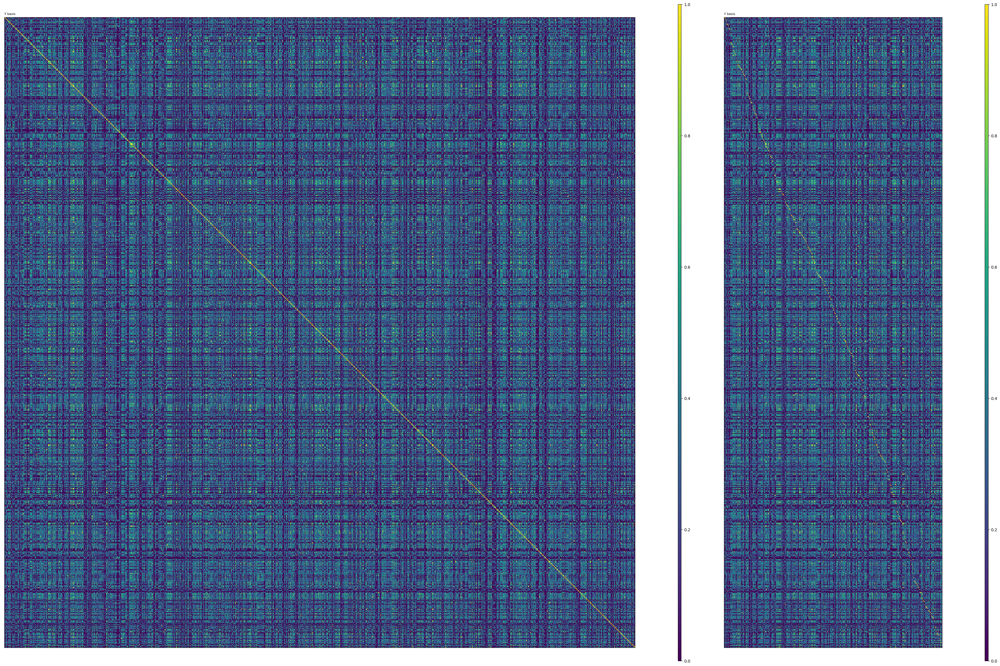

In [157]:
show_matrix([(Y_assoc.toarray(), [0, 0], 'Y basis'), 
             (Y_assoc[:, mask].toarray(), [0, 1], 'Y basis'), 
            ], colorbar=True, pixels=5)

In [162]:
masked = Y_assoc[:, mask].toarray()

In [164]:
masked.shape

(943, 326)

[I] sampling axis 0 with given indices
[I]   sampling from    : (9980, 3362)
[I]              to    : (1225, 3362)
[I] sampling axis 1 with given indices
[I]   sampling from    : (1225, 3362)
[I]              to    : (1225, 1069)
[I] Sampling axis 0 to size 100
[I]   sampling seed    : 3080
[I]   sampling from    : (1225, 1069)
[I]              to    : (100, 1069)
[I] Sampling axis 1 to size 50
[I]   sampling seed    : 4060
[I]   sampling from    : (100, 1069)
[I]              to    : (100, 50)
[I] sampling axis 1 with given indices
[I]   sampling from    : (22, 3362)
[I]              to    : (22, 50)


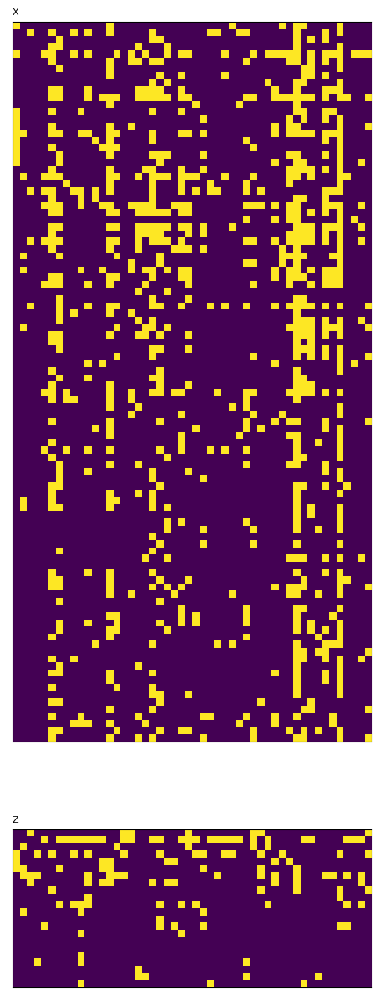

In [4]:
_, _, X = sample(X, axis=0, idx=idx_u)
_, _, X = sample(X, axis=1, idx=idx_v)

_, _, X = sample(X, axis=0, n_samples=n_rows, seed=3080)
idx_v, _, X = sample(X, axis=1, n_samples=n_cols, seed=4060)

data = NetflixGenreData(small=True)
_, _, Z = sample(data.X, idx=idx_v, axis=1)

show_matrix(settings=[(to_dense(X), [0, 0], 'X'), (to_dense(Z), [1, 0], 'Z')])

### Reading ml-1m from text

In [58]:
from models.cmf_vincent.cmf import read_triple_data

class Args():
    def __init__(self, k, iter, user=0, item=0):
        self.train = "../models/cmf_vincent/data/ml-1m/train.txt"
        self.test = "../models/cmf_vincent/data/ml-1m/test.txt"
        self.item = "../models/cmf_vincent/data/ml-1m/item.txt" if item > 0 else ""
        self.user = "../models/cmf_vincent/data/ml-1m/user.txt" if user > 0 else ""
        self.out = "../output/out-cmf.txt"
        self.link = 'log_dense'
        self.alphas = '0.4'
        if user > 0:
            self.alphas += '-' + str(user)
        if item > 0:
            self.alphas += '-' + str(item)
        self.k = k
        self.reg = 0.1
        self.lr = 0.1
        self.iter = iter
        self.tol = 0.0
        self.verbose = True
        self.boolean = True
        
args = Args(k=40, iter=200, user=0.5, item=0.5)

[Xs_trn, Xs_tst, rc_schema, modes] = read_triple_data(args.train, args.test, args.user, args.item, args.link, args.boolean)

X, Y, Z = Xs_trn
Z = Z.T

Xs_trn

[<6040x3883 sparse matrix of type '<class 'numpy.int32'>'
 	with 900188 stored elements in Compressed Sparse Column format>,
 <6040x29 sparse matrix of type '<class 'numpy.float64'>'
 	with 13789 stored elements in Compressed Sparse Column format>,
 <3883x99 sparse matrix of type '<class 'numpy.float64'>'
 	with 10291 stored elements in Compressed Sparse Column format>]

In [59]:
idx_u = X.sum(axis=1) > 120
idx_u = bool_to_index(idx_u)
print(len(idx_u))

idx_v = X.sum(axis=0) > 60
idx_v = bool_to_index(idx_v)
print(len(idx_v))

2333
2270


[I] sampling axis 0 with given indices
[I]   sampling from    : (6040, 3883)
[I]              to    : (2333, 3883)
[I] sampling axis 1 with given indices
[I]   sampling from    : (2333, 3883)
[I]              to    : (2333, 2270)
[I] Sampling axis 0 to size 100
[I]   sampling seed    : 3080
[I]   sampling from    : (2333, 2270)
[I]              to    : (100, 2270)
[I] Sampling axis 1 to size 50
[I]   sampling seed    : 4060
[I]   sampling from    : (100, 2270)
[I]              to    : (100, 50)
[I] sampling axis 0 with given indices
[I]   sampling from    : (6040, 29)
[I]              to    : (100, 29)
[I] sampling axis 1 with given indices
[I]   sampling from    : (99, 3883)
[I]              to    : (99, 50)


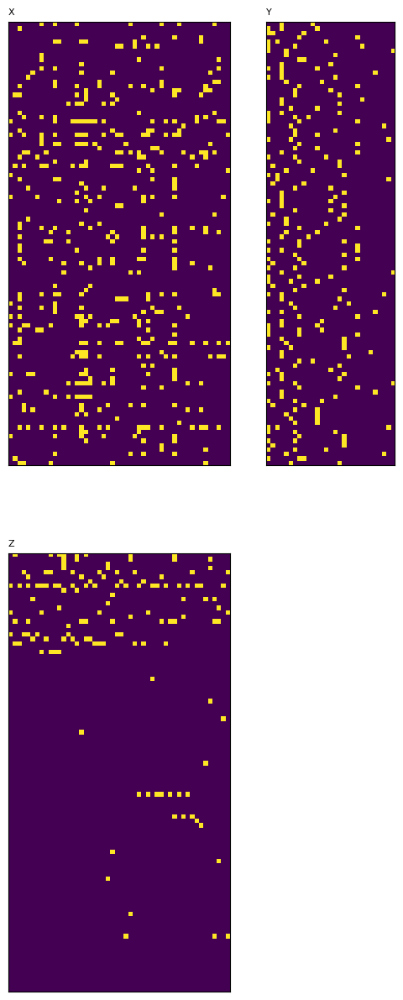

In [60]:
_, _, X = sample(X, axis=0, idx=idx_u)
_, _, X = sample(X, axis=1, idx=idx_v)

idx_u, _, X = sample(X, axis=0, n_samples=n_rows, seed=3080)
idx_v, _, X = sample(X, axis=1, n_samples=n_cols, seed=4060)

_, _, Y = sample(Y, idx=idx_u, axis=0)
_, _, Z = sample(Z, idx=idx_v, axis=1)

show_matrix(settings=[(to_dense(X), [0, 0], 'X'), (to_dense(Y), [0, 1], 'Y'), (to_dense(Z), [1, 0], 'Z')])

### Generate arbitrary Boolean matrix

[I] m            : 100
[I] n            : 50
[I] k            : 5
[I] overlap_flag : False
[I] size_range   : [0.25 0.75 0.25 1.  ]
[I] seed         : 2023
[I] noise        : [0.4  0.02]
[I] seed         : 1024
[I] Using RandomState.
[I] m            : 50
[I] n            : 50
[I] k            : 5
[I] overlap      : [0.2 0.1 0.2 0.1]
[I] seed         : 1997
[I] seed         : 2023
[I] Using RandomState.
[I] Using RandomState.
[I] noise        : [0.1 0.1]
[I] seed         : 1024
[I] Using RandomState.
[I] m            : 22
[I] n            : 50
[I] k            : 5
[I] overlap      : [0.2 0.1 0.2 0.1]
[I] seed         : 1997
[I] seed         : 2024
[I] Using RandomState.
[I] Using RandomState.
[I] noise        : [0.1 0.1]
[I] seed         : 1024
[I] Using RandomState.


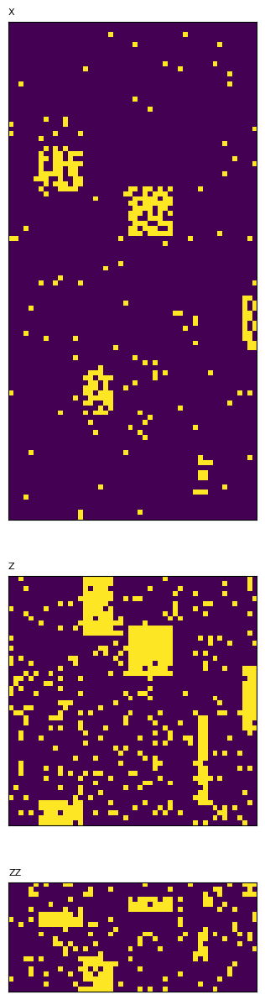

In [4]:
# generate arbitrary Boolean matrix (X)

k=5
overlap_flag=True
noise=[0.4, 0.02]
size_range=[0.25, 0.75, 0.25, 1.0]

X = BlockMatrixGenerator(m=n_rows, n=n_cols, k=k, overlap_flag=False, size_range=size_range)
X.generate(seed=2023) # if no seed assigned, use time instead
X.add_noise(noise=noise, seed=1024)
# X.show_matrix(title='arbitrary boolean matrix X')

# generate arbitrary Boolean matrix (Z)

m = 50
overlap=[0.2, 0.1, 0.2, 0.1]
noise=[0.1, 0.1]

Z = BlockDiagonalMatrixGenerator(m=m, n=n_cols, k=k, overlap=overlap)
Z.generate(seed=1997)
Z.shuffle_factors(seed=2023)
Z.V = X.V # replace one factor
Z.boolean_matmul()
Z.add_noise(noise=noise, seed=1024)
# Z.show_matrix(title="arbitrary boolean matrix Z")

# generate arbitrary Boolean matrix (ZZ)

m = 22
overlap=[0.2, 0.1, 0.2, 0.1]
noise=[0.1, 0.1]

ZZ = BlockDiagonalMatrixGenerator(m=m, n=n_cols, k=k, overlap=overlap)
ZZ.generate(seed=1997)
ZZ.shuffle_factors(seed=2024)
ZZ.V = X.V # replace one factor
ZZ.boolean_matmul()
ZZ.add_noise(noise=noise, seed=1024)
# ZZ.show_matrix(title="arbitrary boolean matrix ZZ")

X, Z = X.X, Z.X

ZZ = ZZ.X

settings = [(to_dense(X), [0, 0], 'X'), 
            (to_dense(Z), [1, 0], 'Z'), 
            (to_dense(ZZ), [2, 0], 'ZZ')]
show_matrix(settings=settings)

### AssoQuant (old)

In [5]:
# from datasets import RatioSplit, NoSplit
# # X_split = RatioSplit(X=X, test_size=0.2, seed=1000)
# X_split = NoSplit(X)

[I] k            : 5
[I] tau          : 0.2
[I] weights      : [0.7, 0.3]
[I] k            : 5
[I] tau          : 0.2
[I] weights      : [0.7, 0.3]
[I] display      : True
[I]   scaling    : 6
[W] Missing validation data.


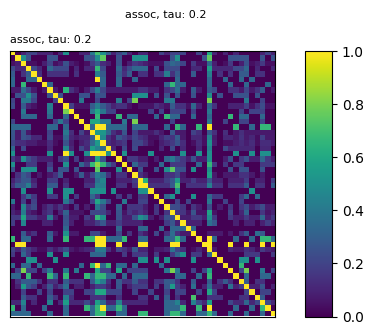

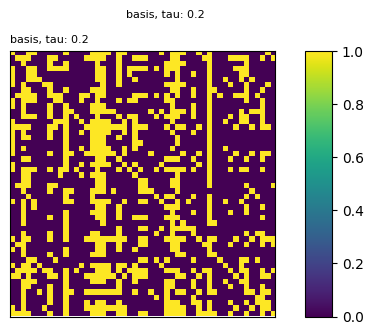

In [110]:
from models import Asso, AssoQuant
from utils import show_matrix, check_sparse

k = 5
tau = 0.2
w = [0.7, 0.3]

asso = Asso(k=k, tau=tau, w=w) # k, w don't matter
aq = AssoQuant(k=k, tau=tau, w=w) # k, tau, w don't matter

asso._fit_prepare(X_train=X, display=True, scaling=6)
# X_assoc = check_sparse(asso.assoc, sparse=False)
# X_basis_asso = check_sparse(asso.basis, sparse=False)
# settings = [(X_basis, [0, 0], 'X_basis ASSO')]
# show_matrix(settings=settings, colorbar=True)

# aq._fit_prepare(X_train=X, display=False)
# X_basis = aq.basis
# settings = [(n_cols - aq.basis + 1, [0, 0], 'X_basis')]
# show_matrix(settings=settings, colorbar=True, scaling=0.5)

# # Z

# tau = 0.2

# asso = Asso(k=k, tau=tau, w=w) # k, w don't matter
# aq = AssoQuant(k=k, tau=tau, w=w) # k, tau, w don't matter

# asso._fit_prepare(X_train=Z, display=True)
# Z_assoc = check_sparse(asso.assoc, sparse=False)
# Z_basis_asso = check_sparse(asso.basis, sparse=False)
# # settings = [(Z_basis, [0, 0], 'Z_basis ASSO')]
# # show_matrix(settings=settings, colorbar=True)

# aq._fit_prepare(X_train=Z, display=False)
# Z_basis = aq.basis
# settings = [(n_cols - aq.basis + 1, [0, 0], 'Z_basis')]
# show_matrix(settings=settings, colorbar=True, scaling=0.5)

In [41]:
import matplotlib.pyplot as plt
import matplotlib as mpl

def plot_basis(assoc, steps):
    assoc = np.asarray(assoc)
    threshold = np.linspace(start=0, stop=1, num=steps, endpoint=False)[1:]
    basis = np.zeros(shape=assoc.shape)
    for t in threshold:
        basis = basis + (assoc > t) * 1
    for i in range(n_cols):
        basis[i, i] = 0
    

    cmap = plt.cm.jet  # define the colormap
    # extract all colors from the .jet map
    cmaplist = [cmap(i) for i in range(cmap.N)]
    # force the first color entry to be grey
    cmaplist[0] = (.5, .5, .5, 1.0)
    # create the new map
    cmap = mpl.colors.LinearSegmentedColormap.from_list(
    'Custom cmap', cmaplist, cmap.N)
    # define the bins and normalize
    norm = mpl.colors.BoundaryNorm(threshold, cmap.N)

    plt.imshow(basis, cmap=cmap)#plt.cm.jet)
    plt.colorbar(mpl.cm.ScalarMappable(cmap=cmap, norm=norm))
    plt.show()

C:\Users\nieht\AppData\Local\Temp\ipykernel_20648\2081160359.py:26: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(mpl.cm.ScalarMappable(cmap=cmap, norm=norm))


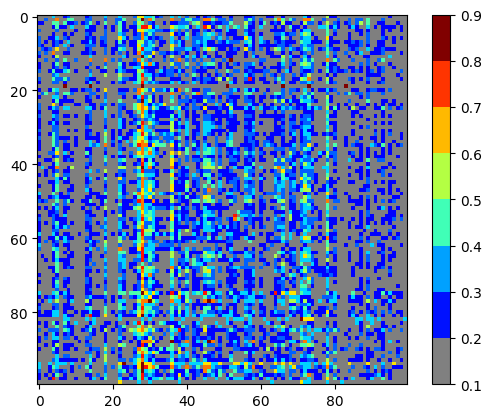

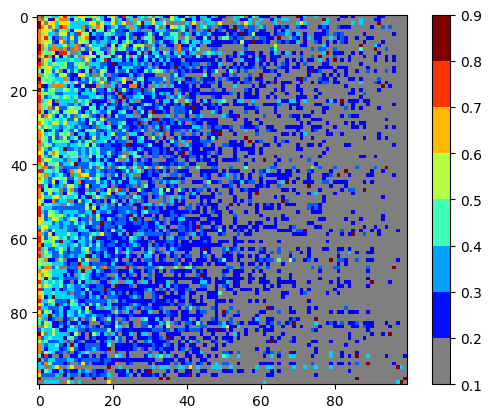

In [42]:
plot_basis(X_assoc, 10)

x = np.asarray(X_assoc)
idx = x.sum(axis=1)
idx = np.flip(np.argsort(idx)).astype(int)
x = x[idx, :]
idx = x.sum(axis=0)
idx = np.flip(np.argsort(idx)).astype(int)
x = x[:, idx]
plot_basis(x, 10)

C:\Users\nieht\AppData\Local\Temp\ipykernel_20648\2081160359.py:26: MatplotlibDeprecationWarning: Unable to determine Axes to steal space for Colorbar. Using gca(), but will raise in the future. Either provide the *cax* argument to use as the Axes for the Colorbar, provide the *ax* argument to steal space from it, or add *mappable* to an Axes.
  plt.colorbar(mpl.cm.ScalarMappable(cmap=cmap, norm=norm))


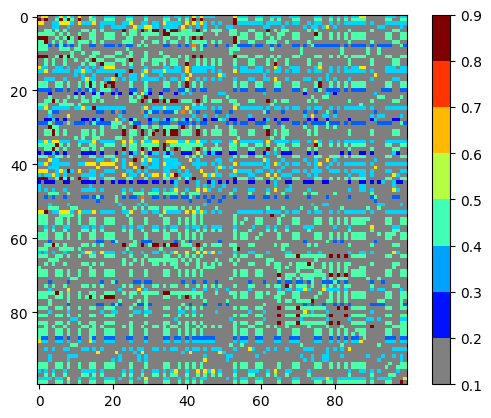

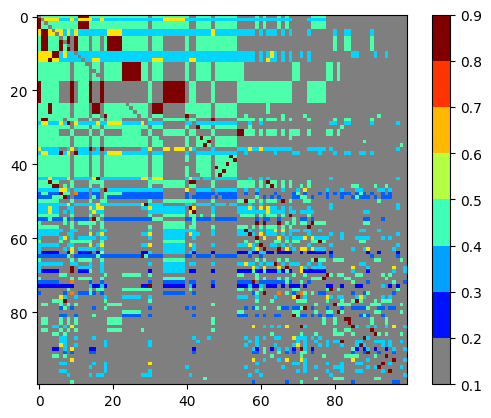

In [43]:
plot_basis(Z_assoc, 10)

x = np.asarray(Z_assoc)
idx = x.sum(axis=1)
idx = np.flip(np.argsort(idx)).astype(int)
x = x[idx, :]
idx = x.sum(axis=0)
idx = np.flip(np.argsort(idx)).astype(int)
x = x[:, idx]
plot_basis(x, 10)

### X - Z - ZZ common basis

In [61]:
def build_assoc_normalize(X):
    n = X.shape[1]
    assoc = to_dense(X.T @ X).astype(float)
    for i in range(n):
        col_sum = X[:, i].sum()
        assoc[i, :] = (assoc[i, :] / col_sum) if col_sum > 0 else 0
    return assoc

def build_assoc(X):
    return to_dense(X.T @ X).astype(float)

def build_basis(X):
    n = X.shape[1]
    assoc = to_dense(X.T @ X).astype(int)
    for i in range(n):
        assoc[i, :] = sort_order(assoc[i, :])
    return assoc.astype(float)

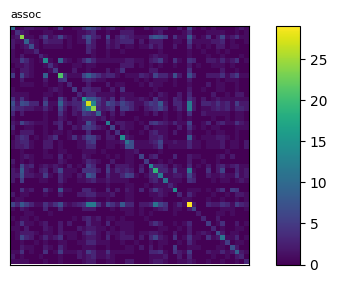

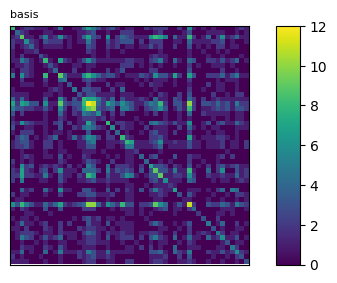

In [62]:
show_matrix(settings=[(build_assoc(X), [0, 0], 'assoc')], colorbar=True, scaling=0.25)

show_matrix(settings=[(build_basis(X), [0, 0], 'basis')], colorbar=True, scaling=0.25)

In [7]:
A0 = build_assoc_normalize(X)
A1 = build_assoc_normalize(Z)
A2 = build_assoc_normalize(ZZ)

B0 = build_basis(X)
B1 = build_basis(Z)
B2 = build_basis(ZZ)

In [8]:
def sorted_set(x, ascend=True):
    x = sorted(list(set(x)))
    return x if ascend else x[::-1]

sorted_set(B0[0], False)

[3.0, 2.0, 1.0, 0.0]

In [10]:
min_basis = 2

coverage_list = [] # (i, l0, j, l1, k, l2, coverage)

for i in tqdm(range(n_cols)):
    for l0 in sorted_set(B0[i], ascend=False): # from highest level
        b0 = B0[i] >= l0
        #########################
        for j in range(n_cols):
            for l1 in sorted_set(B1[j, b0]):
                b1 = B1[j] >= l1
                b1 = multiply(b1, b0)
                if b1.sum() < min_basis:
                    break
                ##########################
                for k in range(n_cols):
                    for l2 in sorted_set(B2[k, b1]):
                        b2 = B2[k] >= l2
                        b2 = multiply(b2, b1)
                        if b2.sum() < min_basis:
                            break
                        coverage_list.append((i, l0, j, l1, k, l2, b2.sum()))

100%|██████████| 50/50 [00:50<00:00,  1.00s/it]


In [18]:
# min_basis = 3

# def sorted_set(x, ascend=True):
#     x = sorted(list(set(x)))
#     return x if ascend else x[::-1]

# sorted_set(B0[0], False)

# def func(i):

#     def sorted_set(x, ascend=True):
#         x = sorted(list(set(x)))
#         return x if ascend else x[::-1]

#     for l0 in sorted_set(B0[i], ascend=False): # from highest level
#         b0 = B0[i] >= l0
#         #########################
#         for j in range(n_cols):
#             for l1 in sorted_set(B1[j, b0]):
#                 b1 = B1[j] >= l1
#                 b1 = multiply(b1, b0)
#                 if b1.sum() < min_basis:
#                     break
#                 ##########################
#                 for k in range(n_cols):
#                     for l2 in sorted_set(B2[k, b1]):
#                         b2 = B2[k] >= l2
#                         b2 = multiply(b2, b1)
#                         if b2.sum() < min_basis:
#                             break
#                         return (i, l0, j, l1, k, l2, b2.sum())
                    
# # with mp.Pool(processes=MAX_WORKERS) as pool:
# #     results = tqdm(
# #         pool.imap_unordered(foo, inputs, chunksize=CHUNK_SIZE),
# #         total=len(inputs),
# #     )  # 'total' is redundant here but can be useful
# #     # when the size of the iterable is unobvious

# with Pool(12) as p:
#     coverage_list = list(tqdm(p.imap_unordered(func, range(n_cols)), total=n_cols))
#     # with tqdm(total=n_cols) as pbar:
#     #     for _ in p.imap_unordered(func, range(0, n_cols)):
#     #         pbar.update()
# # coverage_list = p_map(func, list(range(n_cols)))

  0%|          | 0/100 [00:00<?, ?it/s]

In [11]:
len(coverage_list)

4586636

In [12]:
scores_min = []
scores_mean = []

for c in tqdm(coverage_list):
    i, l0, j, l1, k, l2, cover = c

    b0 = B0[i] >= l0
    b1 = B1[j] >= l1
    b2 = B2[k] >= l2

    b = multiply(b1, b0)
    b = multiply(b2, b1)

    s_min = min(A0[i, b]) * min(A1[j, b]) * min(A2[k, b])

    scores_min.append(s_min)

100%|██████████| 4586636/4586636 [01:14<00:00, 61458.35it/s]


In [15]:
scores = np.zeros(len(coverage_list))
covers = np.zeros(len(coverage_list))

best_basis = []

for i in range(len(coverage_list)):
    _, _, _, _, _, _, cover = coverage_list[i]
    covers[i] = cover
    scores[i] = scores_min[i]

In [51]:
coverage_matrix = np.zeros((len(coverage_list), 3))

for row in range(len(coverage_list)):
    i, l0, j, l1, k, l2, cover = coverage_list[row]
    coverage_matrix[row] = [i, j, k]

# set(coverage_matrix[:, 1])

In [52]:
row_list = sorted_set(coverage_matrix[:, 0]) # 0 - 49

final_score = multiply(covers, scores)

best_indices = []

for r in row_list:
    idx = (coverage_matrix[:, 0] == r)
    idx = bool_to_index(idx)
    ranking = np.argsort(final_score[idx])
    r = ranking[-1]
    r = idx[r]

    best_indices.append(r)

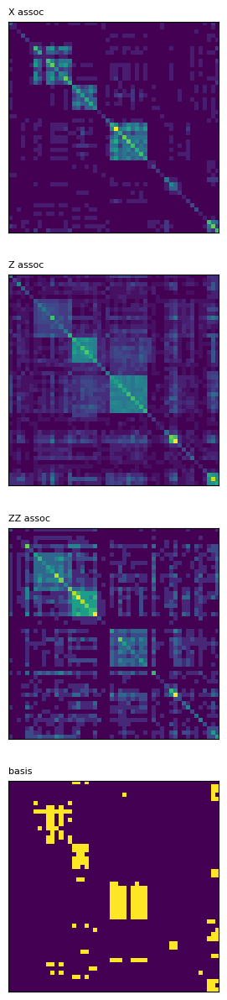

In [54]:
B_tmp = np.zeros((len(best_indices), n_cols))

for row in range(len(best_indices)):
    idx = best_indices[row]

    i, l0, j, l1, k, l2, cover = coverage_list[idx]

    b0 = B0[i] >= l0
    b1 = B1[j] >= l1
    b2 = B2[k] >= l2

    b = multiply(b1, b0)
    b = multiply(b2, b1)

    B_tmp[row, :] = b

show_matrix(settings=[(B_tmp, [3, 0], 'basis'), 
                      (build_assoc(X), [0, 0], 'X assoc'), 
                      (build_assoc(Z), [1, 0], 'Z assoc'), 
                      (build_assoc(ZZ), [2, 0], 'ZZ assoc'), 
                      ])

### X - Z - Y common basis

In [ ]:
def build_assoc_normalize(X):
    n = X.shape[1]
    assoc = to_dense(X.T @ X).astype(float)
    for i in range(n):
        col_sum = X[:, i].sum()
        assoc[i, :] = (assoc[i, :] / col_sum) if col_sum > 0 else 0
    return assoc

def build_assoc(X):
    return to_dense(X.T @ X).astype(float)

def build_basis(X):
    n = X.shape[1]
    assoc = to_dense(X.T @ X).astype(int)
    for i in range(n):
        assoc[i, :] = sort_order(assoc[i, :])
    return assoc.astype(float)

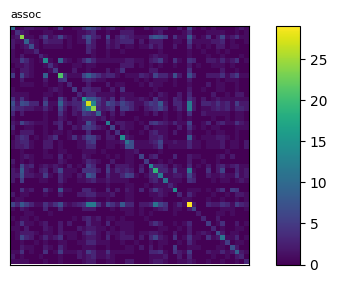

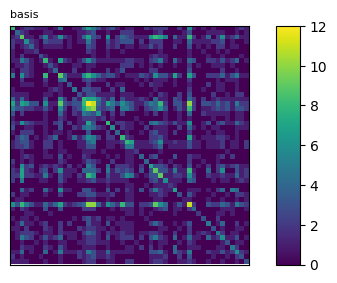

In [ ]:
show_matrix(settings=[(build_assoc(X), [0, 0], 'assoc')], colorbar=True, scaling=0.25)

show_matrix(settings=[(build_basis(X), [0, 0], 'basis')], colorbar=True, scaling=0.25)

In [65]:
A0 = build_assoc_normalize(X)
A1 = build_assoc_normalize(Z)
# A2 = build_assoc_normalize(ZZ)

B0 = build_basis(X)
B1 = build_basis(Z)
# B2 = build_basis(ZZ)

In [66]:
def sorted_set(x, ascend=True):
    x = sorted(list(set(x)))
    return x if ascend else x[::-1]

sorted_set(B0[0], False)

[8.0, 7.0, 6.0, 5.0, 4.0, 3.0, 2.0, 1.0, 0.0]

In [67]:
min_basis = 2

coverage_list = [] # (i, l0, j, l1, k, l2, coverage)

for i in tqdm(range(n_cols)):
    for l0 in sorted_set(B0[i], ascend=False): # from highest level
        b0 = B0[i] >= l0
        #########################
        for j in range(n_cols):
            for l1 in sorted_set(B1[j, b0]):
                b1 = B1[j] >= l1
                b1 = multiply(b1, b0)
                if b1.sum() < min_basis:
                    break
                # ##########################
                # for k in range(n_cols):
                #     for l2 in sorted_set(B2[k, b1]):
                #         b2 = B2[k] >= l2
                #         b2 = multiply(b2, b1)
                #         if b2.sum() < min_basis:
                #             break
                coverage_list.append((i, l0, j, l1, b1.sum()))

100%|██████████| 50/50 [00:00<00:00, 92.49it/s] 


In [ ]:
# min_basis = 3

# def sorted_set(x, ascend=True):
#     x = sorted(list(set(x)))
#     return x if ascend else x[::-1]

# sorted_set(B0[0], False)

# def func(i):

#     def sorted_set(x, ascend=True):
#         x = sorted(list(set(x)))
#         return x if ascend else x[::-1]

#     for l0 in sorted_set(B0[i], ascend=False): # from highest level
#         b0 = B0[i] >= l0
#         #########################
#         for j in range(n_cols):
#             for l1 in sorted_set(B1[j, b0]):
#                 b1 = B1[j] >= l1
#                 b1 = multiply(b1, b0)
#                 if b1.sum() < min_basis:
#                     break
#                 ##########################
#                 for k in range(n_cols):
#                     for l2 in sorted_set(B2[k, b1]):
#                         b2 = B2[k] >= l2
#                         b2 = multiply(b2, b1)
#                         if b2.sum() < min_basis:
#                             break
#                         return (i, l0, j, l1, k, l2, b2.sum())
                    
# # with mp.Pool(processes=MAX_WORKERS) as pool:
# #     results = tqdm(
# #         pool.imap_unordered(foo, inputs, chunksize=CHUNK_SIZE),
# #         total=len(inputs),
# #     )  # 'total' is redundant here but can be useful
# #     # when the size of the iterable is unobvious

# with Pool(12) as p:
#     coverage_list = list(tqdm(p.imap_unordered(func, range(n_cols)), total=n_cols))
#     # with tqdm(total=n_cols) as pbar:
#     #     for _ in p.imap_unordered(func, range(0, n_cols)):
#     #         pbar.update()
# # coverage_list = p_map(func, list(range(n_cols)))

  0%|          | 0/100 [00:00<?, ?it/s]

In [68]:
len(coverage_list)

27864

In [88]:
scores_min = []
scores_mean = []

for c in tqdm(coverage_list):
    i, l0, j, l1, cover = c

    b0 = B0[i] >= l0
    b1 = B1[j] >= l1
    # b2 = B2[k] >= l2

    b = multiply(b1, b0)
    # b = multiply(b2, b1)

    s_min = min(A0[i, b]) * min(A1[j, b]) # * min(A2[k, b])

    scores_min.append(s_min)

100%|██████████| 27864/27864 [00:00<00:00, 90015.49it/s]


In [89]:
scores = np.zeros(len(coverage_list))
covers = np.zeros(len(coverage_list))

best_basis = []

for i in range(len(coverage_list)):
    _, _, _, _, cover = coverage_list[i]
    covers[i] = cover
    scores[i] = scores_min[i]

In [90]:
coverage_matrix = np.zeros((len(coverage_list), 1))

for row in range(len(coverage_list)):
    i, l0, j, l1, cover = coverage_list[row]
    coverage_matrix[row] = [i]

# set(coverage_matrix[:, 0])

In [106]:
row_list = sorted_set(coverage_matrix[:, 0]) # 0 - 49

final_score = multiply(covers, scores)

best_indices = []

for r in row_list:
    idx = (coverage_matrix[:, 0] == r)
    idx = bool_to_index(idx)
    ranking = np.argsort(final_score[idx])
    r = ranking[-60]
    r = idx[r]

    best_indices.append(r)

In [95]:
best_indices[:5]

[478, 932, 1407, 2397, 2969]

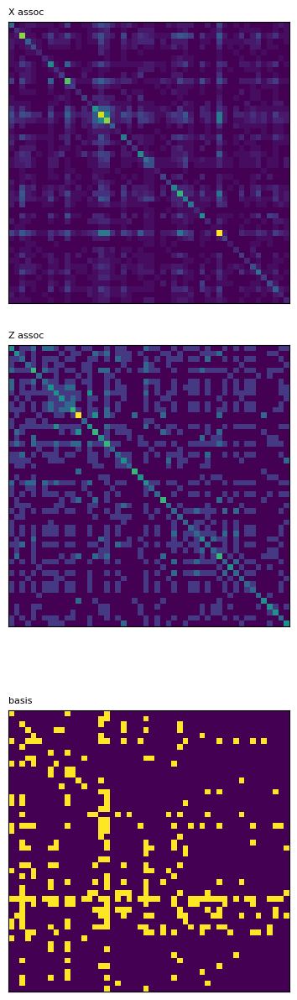

In [111]:
B_tmp = np.zeros((len(best_indices), n_cols))

for row in range(len(best_indices)):
    idx = best_indices[row]

    i, l0, j, l1, cover = coverage_list[idx]
    # print(coverage_list[idx])

    b0 = B0[i] >= l0
    b1 = B1[j] >= l1
    # b2 = B2[k] >= l2

    b = multiply(b1, b0)
    # b = multiply(b2, b1)

    B_tmp[row, :] = b

show_matrix(settings=[(B_tmp, [3, 0], 'basis'), 
                      (build_assoc(X), [0, 0], 'X assoc'), 
                      (build_assoc(Z), [1, 0], 'Z assoc'), 
                    #   (build_assoc(ZZ), [2, 0], 'ZZ assoc'), 
                      ])

### Plug in Asso

[I] k            : 5
[I] tau          : 0.2
[I] weights      : [0.7, 0.3]
[W] Missing validation data.
[I] display      : True
[I]   scaling    : 2


100%|██████████| 5/5 [00:00<00:00,  5.11it/s]                       


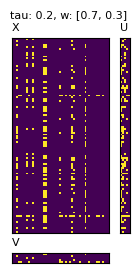

In [113]:
from models import Asso, AssoQuant
from utils import show_matrix, check_sparse

k = 5
tau = 0.2
w = [0.7, 0.3]

aq = AssoQuant(k=k, tau=tau, w=w) # k, tau, w don't matter
aq.basis = to_sparse(B_tmp, 'lil')
aq.fit(X_train=to_sparse(X, 'csr'), display=True, scaling=2)

[W] Missing validation data.
[I] display      : True
[I]   scaling    : 2


100%|██████████| 5/5 [00:00<00:00,  5.99it/s]                       


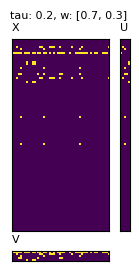

In [114]:
aq.fit(X_train=to_sparse(Z, 'csr'), display=True, scaling=2)

[I] k            : 5
[I] tau          : 0.2
[I] weights      : [0.7, 0.3]
[W] Missing validation data.
[I] display      : True
[I]   scaling    : 2


100%|██████████| 5/5 [00:00<00:00,  5.52it/s]                       


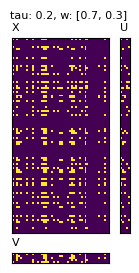

In [116]:
k = 5
tau = 0.2
w = [0.7, 0.3]

asso = Asso(k=k, tau=tau, w=w) # k, tau, w don't matter
asso.fit(X_train=to_sparse(X, 'csr'), display=True, scaling=2)

[I] k            : 5
[I] tau          : 0.2
[I] weights      : [0.7, 0.3]
[W] Missing validation data.
[I] display      : True
[I]   scaling    : 2


100%|██████████| 5/5 [00:00<00:00,  5.80it/s]                       


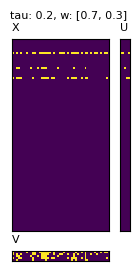

In [117]:
k = 5
tau = 0.2
w = [0.7, 0.3]

aq = AssoQuant(k=k, tau=tau, w=w) # k, tau, w don't matter
aq.basis = asso.basis
aq.fit(X_train=to_sparse(Z, 'csr'), display=True, scaling=2)

### Computing overlap

In [103]:
from multiprocessing import Pool

def f(c):
    i, l0, j, l1, k, l2, cover = c

    b0 = B0[i] >= l0
    b1 = B1[j] >= l1
    b2 = B2[k] >= l2

    b = multiply(b1, b0)
    b = multiply(b2, b1)

    s_min = min(A0[i, b]) * min(A1[j, b]) * min(A2[k, b])

    return s_min


with Pool(12) as p:
    # result = p.map(f, coverage_list)
    result = tqdm(p.imap(f, coverage_list), total=len(coverage_list))

  0%|          | 0/66701092 [00:00<?, ?it/s]

In [33]:
from utils import dot
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from multiprocessing import Pool

def overlap_only(i, j):
    '''overlap of i-th row in X with j-th row in Z
    '''

    score = np.zeros(n_col)

    for t in range(n_col):
        X_row = X_basis[i]
        Z_row = Z_basis[j]
        score[t] = sum(Z_row[X_row<=(t+1)]<=(t+1))
        score[t] = score[t] / (t+1)
        # score[t] = score[t] * X_assoc[i, X_row==(t+1)] # * Z_assoc[i, Z_row==(t+1)]
    return score

def overlap(i, j):
    '''overlap of i-th row in X with j-th row in Z
    '''

    score = np.zeros(n_col)

    for t in range(n_col):
        X_row = X_basis[i]
        Z_row = Z_basis[j]
        score[t] = sum(Z_row[X_row<=(t+1)]<=(t+1))
        score[t] = score[t] / (t+1)
        score[t] = score[t] * X_assoc[i, X_row==(t+1)] # * Z_assoc[i, Z_row==(t+1)]
    return score

def overlap_X_assoc(i, j):
    '''overlap of i-th row in X with j-th row in Z
    '''

    score = np.zeros(n_col)

    for t in range(n_col):
        X_row = X_basis[i]
        Z_row = Z_basis[j]
        score[t] = sum(Z_row[X_row<=(t+1)]<=(t+1))
        score[t] = score[t] / (t+1)
        score[t] = 1 * X_assoc[i, X_row==(t+1)] # * Z_assoc[i, Z_row==(t+1)]
    return score

def overlap_Z_assoc(i, j):
    '''overlap of i-th row in X with j-th row in Z
    '''

    score = np.zeros(n_col)

    for t in range(n_col):
        X_row = X_basis[i]
        Z_row = Z_basis[j]
        score[t] = sum(Z_row[X_row<=(t+1)]<=(t+1))
        score[t] = score[t] / (t+1)
        score[t] = 1 * Z_assoc[i, Z_row==(t+1)]
    return score

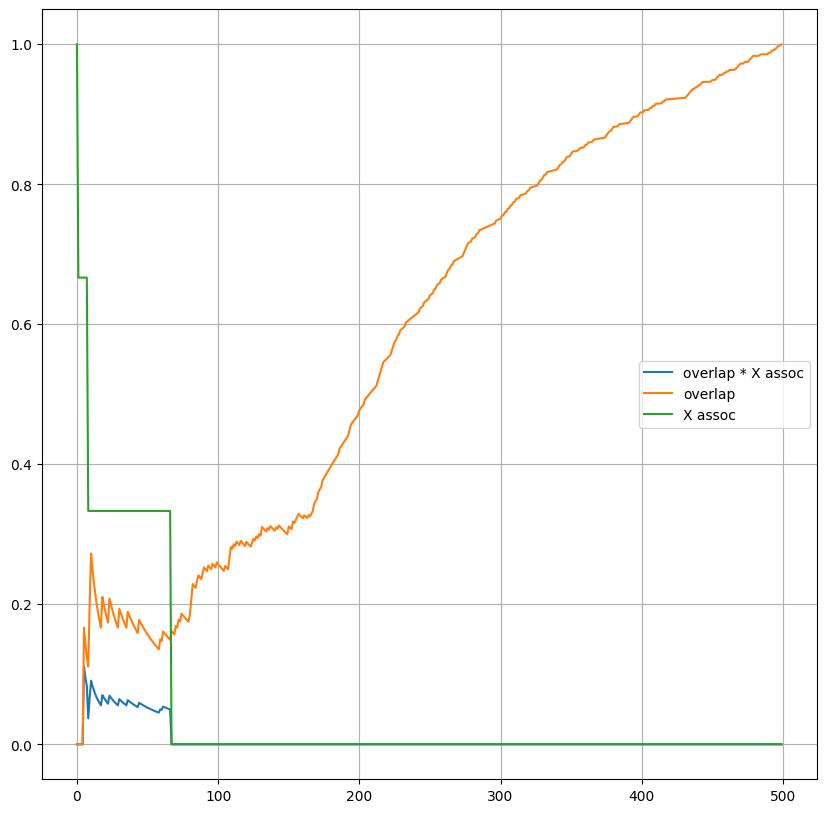

In [48]:
# inconsistant
i = 400 # i-th basis from X_basis
j = 30 # j-th basis from Z_basis

# show_matrix(settings=[(to_dense(X_basis_asso), [0, 0], f'row {i}')])
# display(X[:, i].sum())
# show_matrix(settings=[(to_dense(Z_basis_asso), [0, 0], f'row {i}')])
# display(Z[:, i].sum())

covers = overlap(i, j)
plt.plot(np.arange(n_col), covers);

covers = overlap_only(i, j)
plt.plot(np.arange(n_col), covers);

covers = overlap_X_assoc(i, j)
plt.plot(np.arange(n_col), covers);

covers = overlap_Z_assoc(i, j)
# plt.plot(np.arange(n_col), covers);

plt.legend(['overlap * X assoc', 'overlap', 'X assoc', 'Z assoc'])

plt.grid()

In [19]:
# self correlation
def overlap_self(i, j):
    '''overlap of i-th row in X with j-th row in Z
    '''

    score = np.zeros(n_col)

    for t in range(n_col):
        X_row = X_basis[i]
        Z_row = X_basis[j]
        score[t] = sum(Z_row[X_row<=(t+1)]<=(t+1))
        score[t] = score[t] / (t+1)
        score[t] = score[t] * X_assoc[i, X_row==(t+1)] # * Z_assoc[i, Z_row==(t+1)]
    return score

import matplotlib.pylab as pl

plt.rcParams["figure.figsize"] = [10.00, 10.00]
plt.figure(dpi=1200)

colors = pl.cm.copper(np.linspace(0, 1, n_col))

covers_self = np.zeros((n_col, n_col))
for j in tqdm(range(n_col)):
    covers_self[:, j] = overlap_self(i, j)

100%|██████████| 500/500 [00:08<00:00, 59.68it/s]


<Figure size 12000x12000 with 0 Axes>

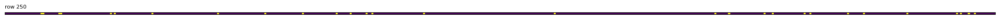

<1x500 sparse matrix of type '<class 'numpy.intc'>'
	with 29 stored elements in Compressed Sparse Row format>

100%|██████████| 500/500 [00:00<00:00, 5585.45it/s]


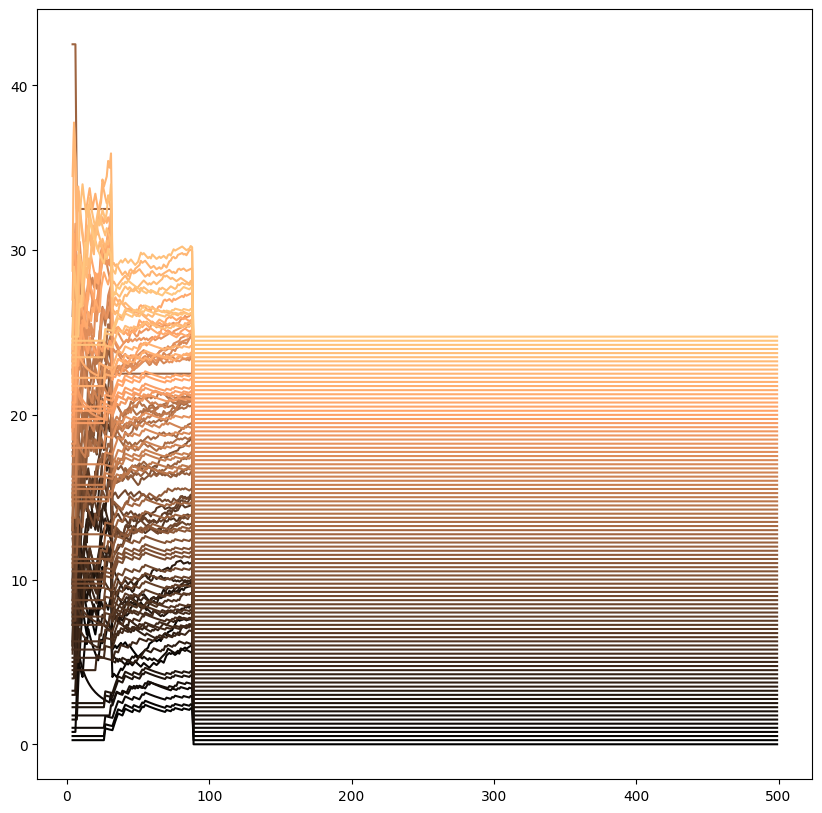

In [20]:
for j in tqdm(range(n_col)):
    if j % 5 == 0:
        pl.plot(np.arange(4, 500),  40 * covers_self[4:500, j] + 0.05 * j, color=colors[j])

In [15]:
# all
import matplotlib.pylab as pl

plt.rcParams["figure.figsize"] = [10.00, 10.00]
plt.figure(dpi=1200)

colors = pl.cm.copper(np.linspace(0, 1, n_col))

covers = np.zeros((n_col, n_col))
for j in tqdm(range(n_col)):
    covers[:, j] = overlap(i, j)



100%|██████████| 500/500 [00:08<00:00, 62.41it/s]


<Figure size 12000x12000 with 0 Axes>

100%|██████████| 500/500 [00:00<00:00, 9033.72it/s]


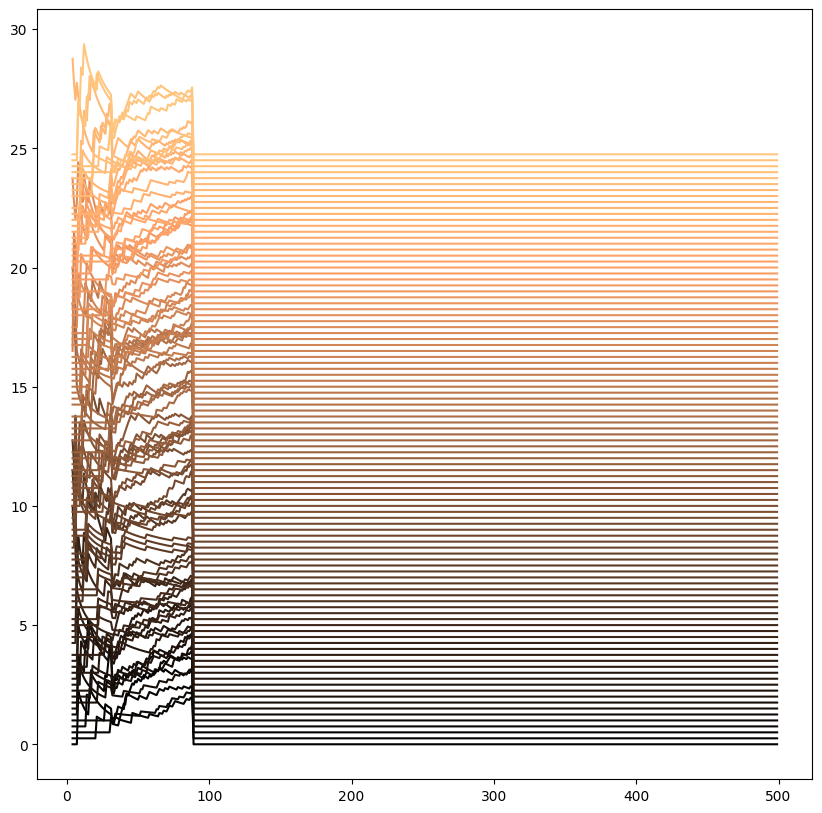

In [18]:
for j in tqdm(range(n_col)):
    if j % 5 == 0:
        pl.plot(np.arange(4, 500),  40 * covers[4:500, j] + 0.05 * j, color=colors[j])

100%|██████████| 500/500 [00:00<00:00, 3493.57it/s]


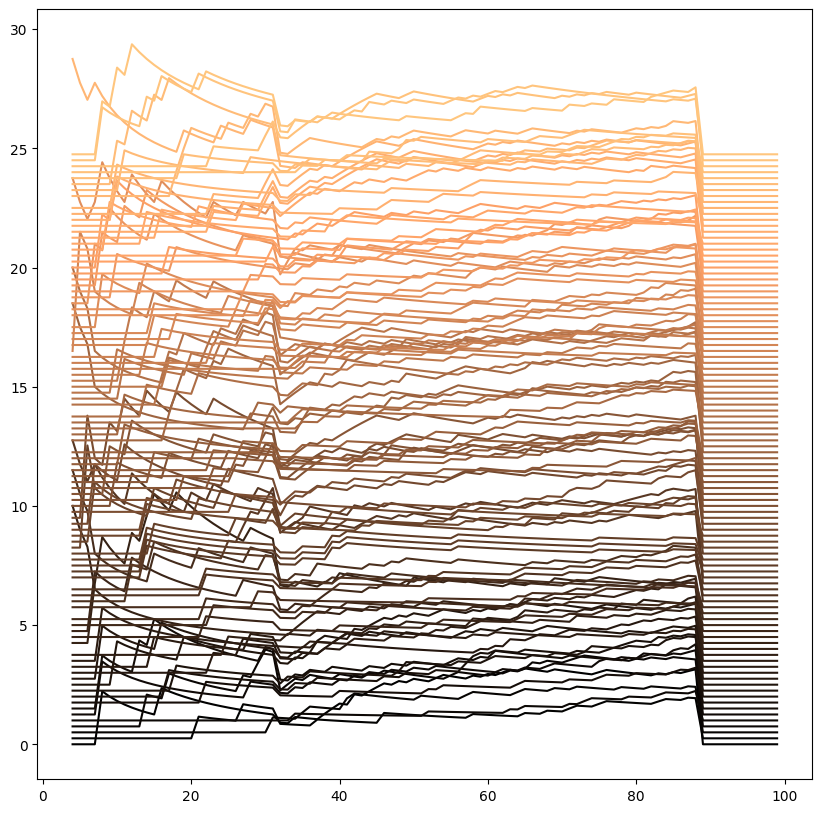

In [16]:
for j in tqdm(range(n_col)):
    if j % 5 == 0:
        pl.plot(np.arange(4, 100),  40 * covers[4:100, j] + 0.05 * j, color=colors[j])